Subject: Open Source Software Development
Topic: Customer opinion analysis using Deep learning
Team-Ehtesham, Sidhant, Himani

Dataset: Amazon customer review dataset

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import numpy as np
import gzip,json,string,spacy,nltk,tqdm,ast,random,pickle,warnings
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk import sent_tokenize
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import gensim
from gensim.models import Word2Vec,KeyedVectors
from scipy.spatial.distance import cdist
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN, SpectralClustering, Birch,MiniBatchKMeans
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score,silhouette_score,silhouette_samples, davies_bouldin_score, calinski_harabasz_score

In [ ]:
path = "/content/drive/MyDrive/PBL_M.Tech/Software_5.json.gz"

In [ ]:
def parse(path):
  g = gzip.open(path, 'rb')
  for l in g:
    yield json.loads(l)
def getDF(path):
  i = 0
  df = {}
  for d in parse(path):
    df[i] = d
    i += 1
  return pd.DataFrame.from_dict(df, orient='index')
df = getDF(path)
df.head()

,overall,verified,reviewTime,reviewerID,asin,style,reviewerName,reviewText,summary,unixReviewTime,vote,image
0,4.0,False,"10 20, 2010",A38NELQT98S4H8,0321719816,{'Format:': ' DVD-ROM'},WB Halper,I've been using Dreamweaver (and it's predeces...,A solid overview of Dreamweaver CS5,1287532800,NaN,NaN
1,4.0,False,"10 18, 2010",A3QJU4FEN8PQSZ,0321719816,{'Format:': ' DVD-ROM'},Grimmy,"The demo is done with the PC version, with ref...",A good value,1287360000,NaN,NaN
2,5.0,False,"10 16, 2010",ACJT8MUC0LRF0,0321719816,{'Format:': ' DVD-ROM'},D. Fowler,If you've been wanting to learn how to create ...,This is excellent software for those who want ...,1287187200,3,NaN
3,5.0,False,"10 12, 2010",AYUF7YETYOLNX,0321719816,{'Format:': ' DVD-ROM'},Bryan Newman,I've been creating websites with Dreamweaver f...,A Fantastic Overview of Dream Weaver and Web D...,1286841600,NaN,NaN
4,5.0,False,"10 7, 2010",A31ICLWQ9CSHRS,0321719816,{'Format:': ' DVD-ROM'},Al Swanson,I decided (after trying a number of other prod...,Excellent Tutorials!,1286409600,NaN,NaN


In [ ]:
df.shape

(12805, 12)

In [ ]:
df['overall'].value_counts()

overall
5.0    5972
4.0    3016
3.0    1598
1.0    1500
2.0     719
Name: count, dtype: int64

In [ ]:
df['reviewerName'].value_counts()[:20]

reviewerName
Amazon Customer                                       257
J. White                                               55
Jerry Saperstein                                       45
A Customer                                             39
Deimos                                                 38
Kindle Customer                                        30
Peace Daddy                                            29
Stephanie Sullivan                                     29
Lincoln                                                26
Tammi                                                  25
ConsumerAdvocate (dakotad555) at (gmail) dot (com)     25
Mark                                                   25
Bill McLean                                            24
Dr. E                                                  24
C. Hill                                                24
Lantana Al                                             24
Sasha Q.                                               23
M

In [ ]:
df.isnull().sum()

overall               0
verified              0
reviewTime            0
reviewerID            0
asin                  0
style              5644
reviewerName          9
reviewText            1
summary               6
unixReviewTime        0
vote               8903
image             12734
dtype: int64

In [ ]:
df = df.dropna(axis=0,subset='reviewText')
df.reset_index(drop=True,inplace=True)

In [ ]:
df1 = df[['reviewText','summary']]
df1.head()

,reviewText,summary
0,I've been using Dreamweaver (and it's predeces...,A solid overview of Dreamweaver CS5
1,"The demo is done with the PC version, with ref...",A good value
2,If you've been wanting to learn how to create ...,This is excellent software for those who want ...
3,I've been creating websites with Dreamweaver f...,A Fantastic Overview of Dream Weaver and Web D...
4,I decided (after trying a number of other prod...,Excellent Tutorials!


In [ ]:
nlp = spacy.load('en_core_web_sm')

In [ ]:
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [ ]:
exc = string.punctuation
def preprocess(text):
    text = text.translate(str.maketrans('','',exc))
    tokens = word_tokenize(text.lower())
    filtered_tokens = [token for token in tokens if token not in stopwords.words('english') and not(token.isdigit())]
    lemmatized_tokens = [nlp(token)[0].lemma_ for token in filtered_tokens]
    return lemmatized_tokens

In [ ]:
revp = []
for r in tqdm.tqdm(df1["reviewText"]):
  sents = sent_tokenize(r)
  pp = [preprocess(s) for s in sents]
  revp.append(pp)
df1["ReviewsTokens"] = revp
df1.head()

100%|██████████| 12804/12804 [1:39:28<00:00,  2.15it/s]
<ipython-input-14-c4222212c890>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1["ReviewsTokens"] = revp


,reviewText,summary,ReviewsTokens
0,I've been using Dreamweaver (and it's predeces...,A solid overview of Dreamweaver CS5,"[[I, use, dreamweaver, predecessor, macromedia..."
1,"The demo is done with the PC version, with ref...",A good value,"[[demo, do, pc, version, reference, mac, versi..."
2,If you've been wanting to learn how to create ...,This is excellent software for those who want ...,"[[you, want, learn, create, website, either, l..."
3,I've been creating websites with Dreamweaver f...,A Fantastic Overview of Dream Weaver and Web D...,"[[I, create, website, dreamweaver, year, exper..."
4,I decided (after trying a number of other prod...,Excellent Tutorials!,"[[decide, try, number, product, switch, gold, ..."


In [ ]:
rev = []
for i in range(df1.shape[0]):
  alltok = []
  for sl in df1["ReviewsTokens"][i]:
    alltok.append(' '.join(sl))
  rev.append(' '.join(alltok))
df1["ReviewsTokens2"] = rev

<ipython-input-15-4b51d8f345e5>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1["ReviewsTokens2"] = rev


In [ ]:
df1.head()

,reviewText,summary,ReviewsTokens,ReviewsTokens2
0,I've been using Dreamweaver (and it's predeces...,A solid overview of Dreamweaver CS5,"[[I, use, dreamweaver, predecessor, macromedia...",I use dreamweaver predecessor macromedia ultra...
1,"The demo is done with the PC version, with ref...",A good value,"[[demo, do, pc, version, reference, mac, versi...",demo do pc version reference mac version need ...
2,If you've been wanting to learn how to create ...,This is excellent software for those who want ...,"[[you, want, learn, create, website, either, l...",you want learn create website either lack conf...
3,I've been creating websites with Dreamweaver f...,A Fantastic Overview of Dream Weaver and Web D...,"[[I, create, website, dreamweaver, year, exper...",I create website dreamweaver year experience t...
4,I decided (after trying a number of other prod...,Excellent Tutorials!,"[[decide, try, number, product, switch, gold, ...",decide try number product switch gold standard...


In [ ]:
warnings.filterwarnings('ignore')
for i,tok in enumerate(df1["ReviewsTokens2"]):
  if len(tok.split()) < 10:
    df1.drop(i,axis=0,inplace=True)
df1.shape

(10721, 4)

In [ ]:
df1.reset_index(drop=True,inplace=True)

In [ ]:
df1.to_csv('AmazonReviewsPreprocessed3.csv')

In [ ]:
path = "/content/drive/MyDrive/PBL_M.Tech/AmazonReviewsPreprocessed3.csv"
df1 = pd.read_csv(path,index_col=0,converters={'ReviewsTokens': ast.literal_eval})
df1.head()

,reviewText,summary,ReviewsTokens,ReviewsTokens2
0,I've been using Dreamweaver (and it's predeces...,A solid overview of Dreamweaver CS5,"[[I, use, dreamweaver, predecessor, macromedia...",I use dreamweaver predecessor macromedia ultra...
1,"The demo is done with the PC version, with ref...",A good value,"[[demo, do, pc, version, reference, mac, versi...",demo do pc version reference mac version need ...
2,If you've been wanting to learn how to create ...,This is excellent software for those who want ...,"[[you, want, learn, create, website, either, l...",you want learn create website either lack conf...
3,I've been creating websites with Dreamweaver f...,A Fantastic Overview of Dream Weaver and Web D...,"[[I, create, website, dreamweaver, year, exper...",I create website dreamweaver year experience t...
4,I decided (after trying a number of other prod...,Excellent Tutorials!,"[[decide, try, number, product, switch, gold, ...",decide try number product switch gold standard...


In [ ]:
nsen = lambda x:sum(1 for s in x if s)
nwor = lambda x:sum(len(s) for s in x if s)

In [ ]:
df1['No. of Sentences'] = df1['ReviewsTokens'].apply(nsen)
df1['No. of Tokens'] = df1['ReviewsTokens'].apply(nwor)
df1.head()

,reviewText,summary,ReviewsTokens,ReviewsTokens2,No. of Sentences,No. of Tokens
0,I've been using Dreamweaver (and it's predeces...,A solid overview of Dreamweaver CS5,"[[I, use, dreamweaver, predecessor, macromedia...",I use dreamweaver predecessor macromedia ultra...,11,109
1,"The demo is done with the PC version, with ref...",A good value,"[[demo, do, pc, version, reference, mac, versi...",demo do pc version reference mac version need ...,25,224
2,If you've been wanting to learn how to create ...,This is excellent software for those who want ...,"[[you, want, learn, create, website, either, l...",you want learn create website either lack conf...,39,811
3,I've been creating websites with Dreamweaver f...,A Fantastic Overview of Dream Weaver and Web D...,"[[I, create, website, dreamweaver, year, exper...",I create website dreamweaver year experience t...,19,222
4,I decided (after trying a number of other prod...,Excellent Tutorials!,"[[decide, try, number, product, switch, gold, ...",decide try number product switch gold standard...,15,103


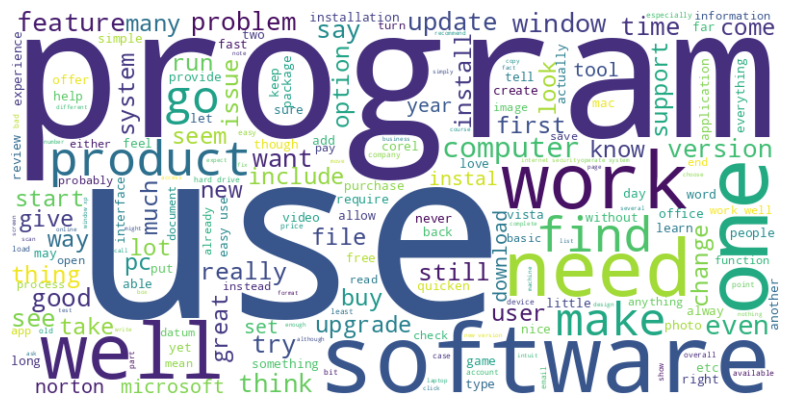

In [ ]:
at = ' '.join(df1['ReviewsTokens2'])
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(at)
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

### **Keyword Extraction from Reviews**

In [ ]:
!pip install yake

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.2/60.2 kB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 10.4 MB/s eta 0:00:00


In [ ]:
import yake
i=0
max_ngram_size = 5
deduplication_threshold = 0.9
deduplication_algo = 'seqm'
numOfKeywords = 20
kw_extractor = yake.KeywordExtractor(lan="en",n=max_ngram_size,dedupLim=deduplication_threshold,dedupFunc=deduplication_algo,top=numOfKeywords,features=None)
keywords = kw_extractor.extract_keywords(df1['ReviewsTokens2'][i])
print(df1['reviewText'][i])
for kw in keywords:
  print(kw)

I've been using Dreamweaver (and it's predecessor Macromedia's UltraDev) for many years.  For someone who is an experienced web designer, this course is a high-level review of the CS5 version of Dreamweaver, but it doesn't go into a great enough level of detail to find it very useful.

On the other hand, this is a great tool for someone who is a relative novice at web design.  It starts off with a basic overview of HTML and continues through the concepts necessary to build a modern web site.  Someone who goes through this course should exit with enough knowledge to create something that does what you want it do do...within reason.  Don't expect to go off and build an entire e-commerce system with only this class under your belt.

It's important to note that there's a long gap from site design to actual implementation.  This course teaches you how to implement a design.  The user interface and overall user experience is a different subject that isn't covered here...it's possible to do a

In [ ]:
newkw = dict()
for tup in keywords:
    if tup[1] not in newkw:
        newkw[tup[1]] = tup
newkw = list(newkw.values())
for kw in newkw:
  print(kw)

('dreamweaver do go great', -0.6479343576543865)
('site someone go course exit', -0.1468655078883634)
('version dreamweaver do go great', -0.11006381161764701)
('start basic overview html continue', 3.421459190899308e-05)
('build entire ecommerce system class', 4.4577559596880604e-05)
('design start basic overview html', 6.368630386192102e-05)
('teach implement design user interface', 8.315429122412523e-05)
('long gap site design actual', 8.315429122412524e-05)
('web design start basic overview', 8.662968871968235e-05)
('relative newcomer experience web designer', 9.970914920819822e-05)
('absolutely abysmal design speak experience', 0.00010257510101554195)
('gap site design actual implementation', 0.0001086433825647712)
('novice web design start basic', 0.00011319711779281304)
('novice relative newcomer experience web', 0.00012726921698729627)
('great implementation absolutely abysmal design', 0.00013290337690256918)


In [ ]:
kw = []
for i in tqdm.tqdm(range(df1.shape[0])):
  kws = kw_extractor.extract_keywords(df1['ReviewsTokens2'][i])
  newkw = dict()
  for tup in kws:
    if tup[1] not in newkw:
        newkw[tup[1]] = tup
  newkw = list(newkw.values())
  kw.append(newkw[:5])
df1['Keywords'] = kw
df1.head()

100%|██████████| 10721/10721 [51:56<00:00,  3.44it/s]


,reviewText,summary,ReviewsTokens,ReviewsTokens2,No. of Sentences,No. of Tokens,Keywords
0,I've been using Dreamweaver (and it's predeces...,A solid overview of Dreamweaver CS5,"[[I, use, dreamweaver, predecessor, macromedia...",I use dreamweaver predecessor macromedia ultra...,11,109,"[(dreamweaver do go great, -0.6479343576543865..."
1,"The demo is done with the PC version, with ref...",A good value,"[[demo, do, pc, version, reference, mac, versi...",demo do pc version reference mac version need ...,25,224,"[(read take test instead put, -0.0439401916117..."
2,If you've been wanting to learn how to create ...,This is excellent software for those who want ...,"[[you, want, learn, create, website, either, l...",you want learn create website either lack conf...,39,811,"[(review hopefully anyone look core, -11.39254..."
3,I've been creating websites with Dreamweaver f...,A Fantastic Overview of Dream Weaver and Web D...,"[[I, create, website, dreamweaver, year, exper...",I create website dreamweaver year experience t...,19,222,"[(version use get chance, -0.8577341102503274)..."
4,I decided (after trying a number of other prod...,Excellent Tutorials!,"[[decide, try, number, product, switch, gold, ...",decide try number product switch gold standard...,15,103,"[(dreamweaver come clearly take learn, -1.0241..."


In [ ]:
for i in range(5):
  print(df1["Keywords"][i])

[('dreamweaver do go great', -0.6479343576543865), ('site someone go course exit', -0.1468655078883634), ('version dreamweaver do go great', -0.11006381161764701), ('start basic overview html continue', 3.421459190899308e-05), ('build entire ecommerce system class', 4.4577559596880604e-05)]
[('read take test instead put', -0.04394019161178094), ('site dw create new web', -0.008785358439346315), ('player screen standard mode resize', 4.137195596907156e-06), ('checklist project management site development', 4.2191646789737814e-06), ('closedcaptione set bookmark selftest chapter', 4.272063849492588e-06)]
[('review hopefully anyone look core', -11.392543450713838), ('feature you also treat', -0.07249338819482222), ('offer several new advantagesfeature', -0.058052988489340006), ('html could use refresher', -0.0554733135996882), ('lot course quite affordable', -0.04542772815739851)]
[('version use get chance', -0.8577341102503274), ('teach one thing I hack', -0.750147164512546), ('upgrade al

In [ ]:
kwlist = []
for sublist in df1["Keywords"]:
  kwlist.extend([tup[0] for tup in sublist])
print(kwlist)

['dreamweaver do go great', 'site someone go course exit', 'version dreamweaver do go great', 'start basic overview html continue', 'build entire ecommerce system class', 'read take test instead put', 'site dw create new web', 'player screen standard mode resize', 'checklist project management site development', 'closedcaptione set bookmark selftest chapter', 'review hopefully anyone look core', 'feature you also treat', 'offer several new advantagesfeature', 'html could use refresher', 'lot course quite affordable', 'version use get chance', 'teach one thing I hack', 'upgrade alone value train', 'learn dw even web', 'overview use dw be substitute', 'dreamweaver come clearly take learn', 'good way go you learn', 'dreamweaver go help product', 'learn dw get design', 'dreamweaver go help product review', 'work software watch follow direction', 'video wellpace deliver understandable manner', 'wellpace deliver understandable manner', 'support highly recommend teach series', 'love detail cl

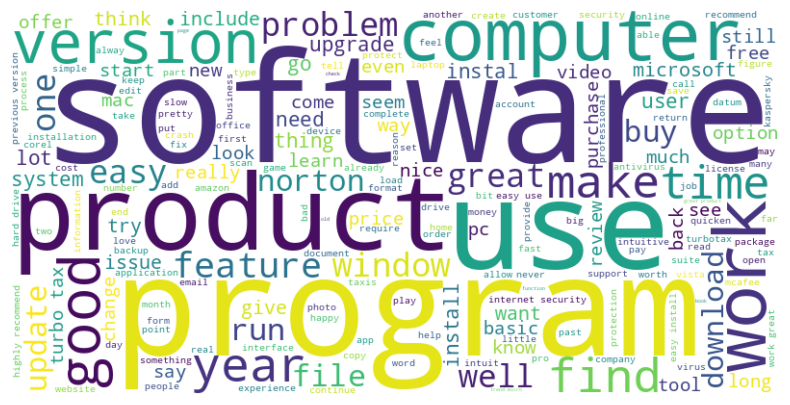

In [ ]:
at = ' '.join(kwlist)
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(at)
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [ ]:
kcol = [[],[],[],[],[]]
for i in range(df1.shape[0]):
  for j in range(5):
    try:
      kcol[j].append(df1['Keywords'][i][j][0])
    except:
      kcol[j].append(np.nan)
df1["k1"] = kcol[0]
df1["k2"] = kcol[1]
df1["k3"] = kcol[2]
df1["k4"] = kcol[3]
df1["k5"] = kcol[4]
df1.head()

,reviewText,summary,ReviewsTokens,ReviewsTokens2,No. of Sentences,No. of Tokens,Keywords,k1,k2,k3,k4,k5
0,I've been using Dreamweaver (and it's predeces...,A solid overview of Dreamweaver CS5,"[[I, use, dreamweaver, predecessor, macromedia...",I use dreamweaver predecessor macromedia ultra...,11,109,"[(dreamweaver do go great, -0.6479343576543865...",dreamweaver do go great,site someone go course exit,version dreamweaver do go great,start basic overview html continue,build entire ecommerce system class
1,"The demo is done with the PC version, with ref...",A good value,"[[demo, do, pc, version, reference, mac, versi...",demo do pc version reference mac version need ...,25,224,"[(read take test instead put, -0.0439401916117...",read take test instead put,site dw create new web,player screen standard mode resize,checklist project management site development,closedcaptione set bookmark selftest chapter
2,If you've been wanting to learn how to create ...,This is excellent software for those who want ...,"[[you, want, learn, create, website, either, l...",you want learn create website either lack conf...,39,811,"[(review hopefully anyone look core, -11.39254...",review hopefully anyone look core,feature you also treat,offer several new advantagesfeature,html could use refresher,lot course quite affordable
3,I've been creating websites with Dreamweaver f...,A Fantastic Overview of Dream Weaver and Web D...,"[[I, create, website, dreamweaver, year, exper...",I create website dreamweaver year experience t...,19,222,"[(version use get chance, -0.8577341102503274)...",version use get chance,teach one thing I hack,upgrade alone value train,learn dw even web,overview use dw be substitute
4,I decided (after trying a number of other prod...,Excellent Tutorials!,"[[decide, try, number, product, switch, gold, ...",decide try number product switch gold standard...,15,103,"[(dreamweaver come clearly take learn, -1.0241...",dreamweaver come clearly take learn,good way go you learn,dreamweaver go help product,learn dw get design,dreamweaver go help product review


In [ ]:
df1.to_csv("AmazonReviewsKeywordsExtracted.csv")

In [ ]:
path = "/content/drive/MyDrive/PBL_M.Tech/AmazonReviewsKeywordsExtracted.csv"
df1 = pd.read_csv(path,index_col=0,converters={'ReviewsTokens': ast.literal_eval,'Keywords':ast.literal_eval})
df1.head()

,reviewText,summary,ReviewsTokens,ReviewsTokens2,No. of Sentences,No. of Tokens,Keywords,k1,k2,k3,k4,k5
0,I've been using Dreamweaver (and it's predeces...,A solid overview of Dreamweaver CS5,"[[I, use, dreamweaver, predecessor, macromedia...",I use dreamweaver predecessor macromedia ultra...,11,109,"[(dreamweaver do go great, -0.6479343576543865...",dreamweaver do go great,site someone go course exit,version dreamweaver do go great,start basic overview html continue,build entire ecommerce system class
1,"The demo is done with the PC version, with ref...",A good value,"[[demo, do, pc, version, reference, mac, versi...",demo do pc version reference mac version need ...,25,224,"[(read take test instead put, -0.0439401916117...",read take test instead put,site dw create new web,player screen standard mode resize,checklist project management site development,closedcaptione set bookmark selftest chapter
2,If you've been wanting to learn how to create ...,This is excellent software for those who want ...,"[[you, want, learn, create, website, either, l...",you want learn create website either lack conf...,39,811,"[(review hopefully anyone look core, -11.39254...",review hopefully anyone look core,feature you also treat,offer several new advantagesfeature,html could use refresher,lot course quite affordable
3,I've been creating websites with Dreamweaver f...,A Fantastic Overview of Dream Weaver and Web D...,"[[I, create, website, dreamweaver, year, exper...",I create website dreamweaver year experience t...,19,222,"[(version use get chance, -0.8577341102503274)...",version use get chance,teach one thing I hack,upgrade alone value train,learn dw even web,overview use dw be substitute
4,I decided (after trying a number of other prod...,Excellent Tutorials!,"[[decide, try, number, product, switch, gold, ...",decide try number product switch gold standard...,15,103,"[(dreamweaver come clearly take learn, -1.0241...",dreamweaver come clearly take learn,good way go you learn,dreamweaver go help product,learn dw get design,dreamweaver go help product review


In [ ]:
corpus = []
for i in range(df1.shape[0]):
  corpus.extend(df1['ReviewsTokens'][i])

In [ ]:
model = Word2Vec(window=10,workers=4,vector_size=100,seed=0)
model.build_vocab(corpus)
model.train(corpus,total_examples=model.corpus_count,epochs=100,compute_loss=True)

(101287964, 114154900)

In [ ]:
model.get_latest_training_loss()

33710408.0

In [ ]:
model.wv.most_similar('price')

[('cost', 0.6976092457771301),
 ('pricing', 0.6214452385902405),
 ('expensive', 0.4779601991176605),
 ('buck', 0.4463159739971161),
 ('pricey', 0.4289992153644562),
 ('roi', 0.4028829336166382),
 ('value', 0.4025440216064453),
 ('re', 0.4019131660461426),
 ('dollar', 0.40141916275024414),
 ('fee', 0.3802308142185211)]

In [ ]:
model.wv.doesnt_match(['version','software','want','download','product'])

'want'

In [ ]:
model.save('Word2VecModel')

In [ ]:
mpath = "/content/drive/MyDrive/PBL_M.Tech/Word2VecModel"
model = Word2Vec.load(mpath)
model.wv.most_similar('bug')

[('issue', 0.6167237758636475),
 ('problem', 0.5608627796173096),
 ('glitch', 0.5186932682991028),
 ('annoyance', 0.4331585764884949),
 ('r5', 0.40614640712738037),
 ('update', 0.404349684715271),
 ('flaw', 0.4025629758834839),
 ('quirk', 0.3759511411190033),
 ('error', 0.3596751391887665),
 ('consequence', 0.3588290512561798)]

In [ ]:
feat = np.zeros((df1.shape[0],100))
for i,rev in enumerate(df1['ReviewsTokens']):
  ft = []
  for sen in rev:
    for w in sen:
      try:
        ft.append(list(model.wv[w]))
      except KeyError:
        continue
  ft = np.array(ft)
  feat[i] = ft.mean(axis=0)

In [ ]:
feat.shape

(10721, 100)

In [ ]:
print("100D Vectors for first 2 reviews:")
feat[:2]

100D Vectors for first 2 reviews:


array([[ 0.29478064,  0.60730058,  0.64356762,  0.03895747, -0.4118796 ,
        -0.22242151,  0.12710246,  0.5606885 , -0.31630895, -0.4304066 ,
         0.38853416,  0.32673487,  0.22613306,  0.03836208, -0.23250636,
         0.63284838,  0.05092387,  0.41945386,  0.11448687, -0.80797398,
        -0.90225446, -0.03172776,  0.00969108, -0.01652629, -0.42345843,
        -0.33158052, -0.4692798 , -0.72243208, -0.00677991,  0.09252097,
         0.35817745,  0.12470855, -0.31358281,  0.4122161 ,  0.03884589,
        -0.27094674,  0.22475787, -0.23978527,  0.2423591 , -0.09886739,
         0.55394804, -0.36172223, -0.16201769, -0.11969434,  0.22195897,
         0.50641459,  0.0543234 ,  0.19304791,  0.0027832 ,  0.36251613,
         0.69623065, -0.20856625, -0.25596768, -1.1492517 , -0.08856665,
         0.26477554, -0.01361565, -0.08006468,  0.64424813, -0.69947112,
        -0.29194683, -0.4629899 , -0.26761073,  0.54794687, -0.21833748,
        -0.40295869, -0.31651625,  0.60000581, -0.6

In [ ]:
with open("FeatureMatrix.pickle","wb") as f:
  pickle.dump(feat, f)

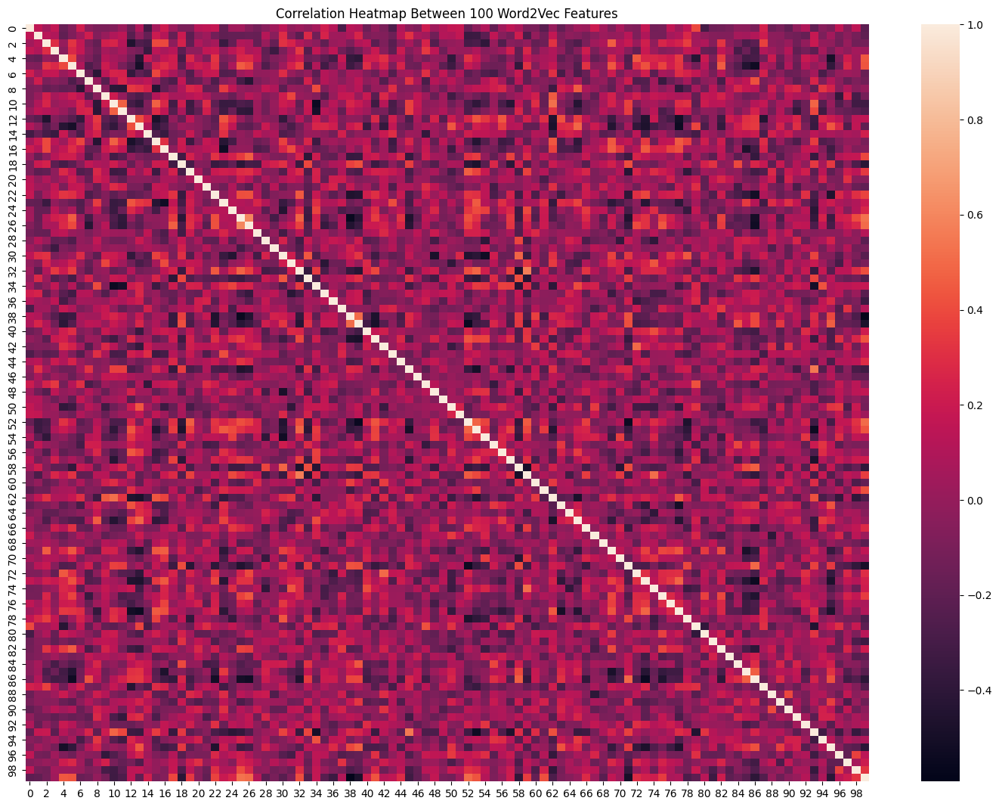

In [ ]:
corr = np.corrcoef(feat,rowvar=False)
plt.figure(figsize=(18,13))
sns.heatmap(corr)
plt.title("Correlation Heatmap Between 100 Word2Vec Features")
plt.show()

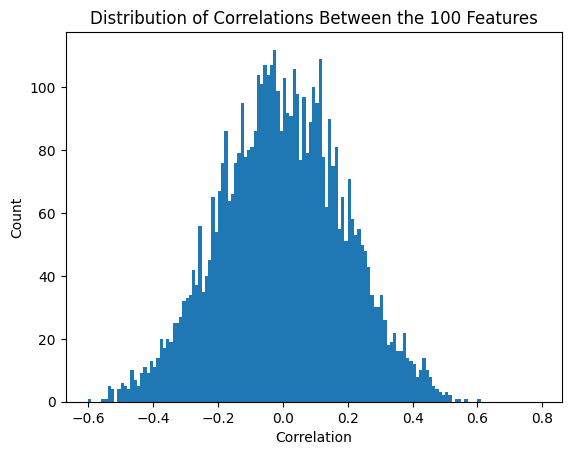

In [ ]:
c = []
for i in range(corr.shape[0]):
  for j in range(i+1,corr.shape[1]):
    c.append(corr[i,j])
plt.hist(c,bins=[i for i in np.arange(-0.6,0.8,0.01)])
plt.title("Distribution of Correlations Between the 100 Features")
plt.xlabel("Correlation")
plt.ylabel("Count")
plt.show()

### **Dimensionality Reduction of 100D Word2Vec Features**

#### Using PCA

In [ ]:
pca1 = PCA(2,random_state=42)
pca2 = PCA(3,random_state=42)
X2d = pca1.fit_transform(feat)
X3d = pca2.fit_transform(feat)
print(X2d[:5])
print(X3d[:5])

[[ 2.49834069  0.37540534]
 [ 2.88275241 -0.6163446 ]
 [ 3.57462573 -0.08828059]
 [ 2.67224347  0.43352154]
 [ 2.63977678  0.97760277]]
[[ 2.49834073  0.37540526  0.69280793]
 [ 2.88275243 -0.61634478 -2.23536286]
 [ 3.57462583 -0.08828091 -2.05701314]
 [ 2.6722435   0.4335213  -0.26248588]
 [ 2.6397768   0.97760279  0.23234958]]


In [ ]:
v = pca2.fit_transform(model.wv.get_normed_vectors())
v[:5]

array([[-0.2928686 ,  0.19591415,  0.30841973],
       [-0.29773432,  0.06737372,  0.19076695],
       [-0.21164036,  0.2622485 , -0.03332007],
       [-0.19398367, -0.21751887, -0.01104857],
       [-0.19515193, -0.11309019,  0.00838092]], dtype=float32)

#### Using TSNE

In [ ]:
tsne = TSNE(2,random_state=42)
Xtsne = tsne.fit_transform(feat)
print(Xtsne[:5])

[[ 58.421207    7.2070055]
 [ 42.657864  -12.699498 ]
 [ 42.724155  -12.490929 ]
 [ 58.707294    7.884975 ]
 [ 58.616024    7.473209 ]]


In [ ]:
y = np.array(model.wv.index_to_key)
print("First Few Words of Word2Vec model:",y[:5])

First Few Words of Word2Vec model: ['use' 'software' 'program' 'get' 'do']


In [ ]:
print("No. of Unique Words in Word2Vec Corpus =",len(y))

No. of Unique Words in Word2Vec Corpus = 8161


### **Visualization of Reduced Word2Vec Features**

#### Plots of 3D Features reduced using PCA

In [ ]:
fig = px.scatter_3d(v[:100],x=0,y=1,z=2,color=y[:100])
fig.show()

In [ ]:
rwi = random.sample(range(len(v)), 100)
fig = px.scatter_3d(v[rwi],x=0,y=1,z=2,color=y[rwi])
fig.show()

In [ ]:
fig = px.scatter(x=X2d[:,0],y=X2d[:,1])
fig.update_layout(title={'text': '2D Word2Vec Features reduced using PCA','y': 0.95,'x': 0.5})
fig.show()

In [ ]:
fig = px.scatter(x=Xtsne[:,0],y=Xtsne[:,1])
fig.update_layout(title={'text': '2D Word2Vec Features reduced using t-SNE','y': 0.95,'x': 0.5})
fig.show()

### **Clustering of Word2Vec Features**



In [ ]:
def KMeansfit(n,X):
  km = KMeans(n_clusters=n, random_state=42,n_init='auto')
  km.fit(X)
  return km.labels_,km.cluster_centers_,km.inertia_

#### Elbow-Test for Different Dimentional Features

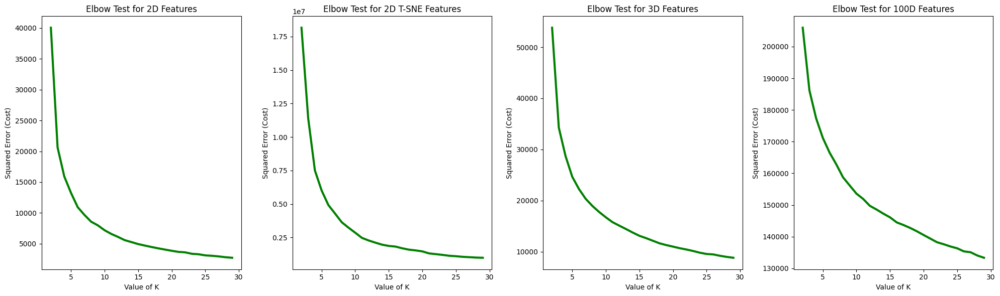

In [ ]:
fig, axs = plt.subplots(1,4, figsize=(20, 6))
titles = ["2D Features","2D T-SNE Features","3D Features","100D Features"]
lablist,cclist = [],[]
for i,fs in enumerate([X2d,Xtsne,X3d,feat]):
  cost = []
  for k in range(2,30):
    labs,cc,iner = KMeansfit(k,fs)
    cost.append(iner)
    if k==10:
      lablist.append(labs)
      cclist.append(cc)
  axs[i].plot(range(2,30), cost, color ='g', linewidth ='3')
  axs[i].set_title(f"Elbow Test for {titles[i]}")
  axs[i].set_xlabel("Value of K")
  axs[i].set_ylabel("Squared Error (Cost)")
plt.tight_layout()
plt.show()

In [ ]:
for i in range(4):
  for j in range(i+1,4):
    ari = adjusted_rand_score(lablist[i], lablist[j])
    nmi = normalized_mutual_info_score(lablist[i], lablist[j])
    print(f"\nScores for Labels ({titles[i]},{titles[j]})")
    print("Adjusted Rand Index =", ari)
    print("Normalized Mutual Information =", nmi)


Scores for Labels (2D Features,2D T-SNE Features)
Adjusted Rand Index = 0.26000248387085867
Normalized Mutual Information = 0.44790631124763436

Scores for Labels (2D Features,3D Features)
Adjusted Rand Index = 0.3186850238215603
Normalized Mutual Information = 0.5414560204889944

Scores for Labels (2D Features,100D Features)
Adjusted Rand Index = 0.3177229043214126
Normalized Mutual Information = 0.4888554696095744

Scores for Labels (2D T-SNE Features,3D Features)
Adjusted Rand Index = 0.294241649881856
Normalized Mutual Information = 0.4468947335593027

Scores for Labels (2D T-SNE Features,100D Features)
Adjusted Rand Index = 0.504817830973305
Normalized Mutual Information = 0.617315074030218

Scores for Labels (3D Features,100D Features)
Adjusted Rand Index = 0.3149218922117751
Normalized Mutual Information = 0.4712404300998208


In [ ]:
print("Most representative terms per cluster (based on centroids):")
for i in range(10):
    tokens_per_cluster = ""
    most_representative = model.wv.most_similar(positive=[cclist[3][i]], topn=10)
    for t in most_representative:
        tokens_per_cluster += f"{t[0]} "
    print(f"Cluster {i}: {tokens_per_cluster}")

Most representative terms per cluster (based on centroids):
Cluster 0: edit video photo photoshop editor beginner powerful amateur tool novice 
Cluster 1: reinstall computer install instal reboot uninstall uninstalle machine run download 
Cluster 2: turbotax return tax taxis tt form taxcut year federal efile 
Cluster 3: window xp vista run machine upgrade win os desktop bootcamp 
Cluster 4: version year buy product upgrade purchase quicken pay subscription money 
Cluster 5: norton antivirus mcafee avg kaspersky virus bitdefender computer security protection 
Cluster 6: usb cable device router lan wireless adapter port hub uplink 
Cluster 7: office excel wordperfect wp doc onenote word publisher ms powerpoint 
Cluster 8: need want payroll employee plan account business software basic you 
Cluster 9: lesson learn teach language phrase fun spanish study brain italian 


In [ ]:
test_cluster = 9
most_representative_docs = np.argsort(np.linalg.norm(feat - cclist[3][test_cluster], axis=1))
for d in most_representative_docs[:3]:
    print(d)
    print(df1['reviewText'][d])
    print("-------------")

3175
I was very happy to get this product. I am Japanese American myself but am ashamed to say pretty much the only Japanese I know is being able to order from a menu, or else the more impolite words like "bakatare" (stupid) or "yakamashi" (loudmouth) or "monku" (complaining.. hence the "monkuboy" moniker, haha). While my friends went to Japanese school on Saturday mornings I resisted and my parents never forced me so I learned nothing. However, I bet everyone who went forgot how to speak or understand it anyway so we all wound up at the same place.

Regarding this program: The box is impressively heavy. It installed without a hitch using the accurate instructions, though it did take a fairly long time. The headset installed without a hitch also - I use Windows XP and it recognized the device right away and the first test with the software was successful.  It is a rather flimsy headset so you have to treat it gently.  Also, make sure you turn down the volume on your PC before using it 

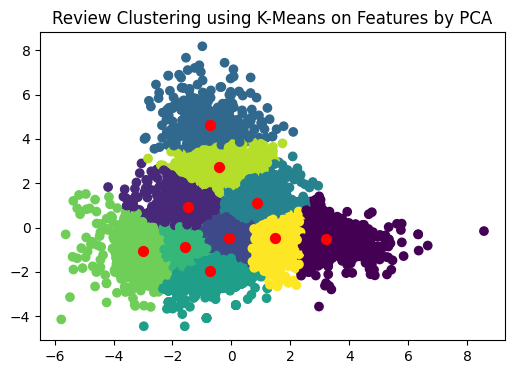

In [ ]:
labs2d, cc2d, _ = KMeansfit(10,X2d)
plt.figure(figsize=(6, 4))
plt.scatter(X2d[:, 0], X2d[:, 1], c=labs2d, cmap='viridis')
plt.scatter(cc2d[:, 0], cc2d[:, 1,], s=50, c='red')
plt.title("Review Clustering using K-Means on Features by PCA")
plt.show()

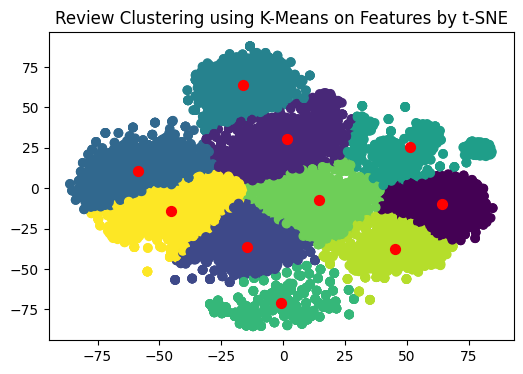

In [ ]:
labs2d, cc2d, _ = KMeansfit(10,Xtsne)
plt.figure(figsize=(6, 4))
plt.scatter(Xtsne[:, 0], Xtsne[:, 1], c=labs2d, cmap='viridis')
plt.scatter(cc2d[:, 0], cc2d[:, 1,], s=50, c='red')
plt.title("Review Clustering using K-Means on Features by t-SNE")
plt.show()

In [ ]:
labs2d, cc2d, _ = KMeansfit(10,Xtsne)
fig = px.scatter(x=Xtsne[:,0],y=Xtsne[:,1],color=labs2d)
fig.update_layout(title={'text': 'Review Clustering using K-Means on Features by t-SNE','y': 0.95,'x': 0.5})
fig.show()

#### Scores of Clustering with different dimensional features

In [ ]:
def compute_scores(X,labels):
  sil = silhouette_score(X,labels)
  db = davies_bouldin_score(X,labels)
  ch = calinski_harabasz_score(X,labels)
  return sil,db,ch

In [ ]:
i=0
for fs,lb in zip([X2d,Xtsne,X3d,feat],lablist):
  print(f"\nScores for {titles[i]}")
  sil,db,ch = compute_scores(fs,lb)
  print("Silhouette Score =",sil)
  print("DB Score =",db)
  print("CH Score =",ch)
  i+=1


Scores for 2D Features
Silhouette Score = 0.32854591825977125
DB Score = 0.8863909090036983
CH Score = 9211.936808998535

Scores for 2D T-SNE Features
Silhouette Score = 0.39423522
DB Score = 0.8524748681077737
CH Score = 12099.751216663552

Scores for 3D Features
Silhouette Score = 0.23887913452608964
DB Score = 1.1396322059684931
CH Score = 4268.547276814324

Scores for 100D Features
Silhouette Score = 0.08794391587559677
DB Score = 2.6776885750739776
CH Score = 584.6545841301288


Clustering Scores with Varying Dimensionality of Features

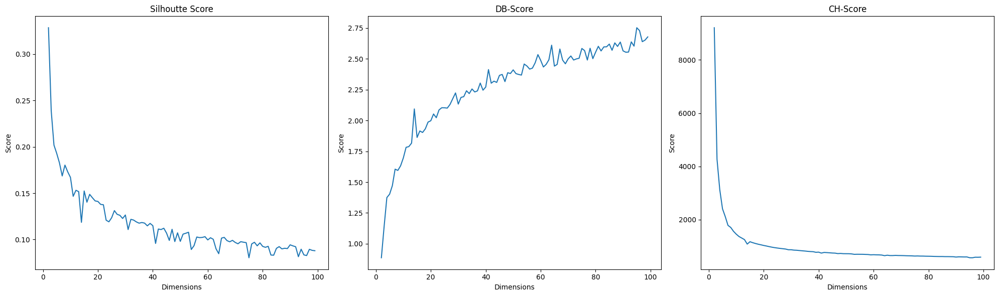

In [ ]:
sils, dbs, chs = [], [], []
dims = range(2, 100)
for d in dims:
    X = PCA(d, random_state=42).fit_transform(feat)
    labs, _, _ = KMeansfit(10, X)
    sil, db, ch = compute_scores(X, labs)
    sils.append(sil)
    dbs.append(db)
    chs.append(ch)
fig, axs = plt.subplots(1, 3, figsize=(20, 6))
for ax, score, label in zip(axs, [sils, dbs, chs], ["Silhoutte Score", "DB-Score", "CH-Score"]):
    ax.plot(dims, score)
    ax.set_title(label)
    ax.set_xlabel("Dimensions")
    ax.set_ylabel("Score")
plt.tight_layout()
plt.show()

In [ ]:
!pip install hdbscan

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.2/5.2 MB 15.5 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached Cython-0.29.37-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.manylinux_2_24_x86_64.whl (1.9 MB)
  Created wheel for hdbscan: filename=hdbscan-0.8.33-cp310-cp310-linux_x86_64.whl size=3039293 sha256=af38964a9b28b935cf330ebac3126ee6bb4557c7087f9212a681953bc0e1ad36
  Stored in directory: /root/.cache/pip/wheels/75/0b/3b/dc4f60b7cc455efaefb62883a7483e76f09d06ca81cf87d610
Successfully built hdbscan
  Attempting uninstall: cython
    Found existing installation: Cython 3.0.10
    Uninstalling Cython-3.0.10:
      Successfully uninstalled Cython-3.0.10


In [ ]:
def mbkmeans_clusters(X, k, mb, print_sil_values):
    km = MiniBatchKMeans(n_clusters=k, batch_size=mb,random_state=42,n_init='auto').fit(X)
    if print_sil_values:
        print(f"For n_clusters = {k}")
        print(f"Silhouette coefficient: {silhouette_score(X, km.labels_):0.2f}")
        print(f"Inertia:{km.inertia_}")
        sample_silhouette_values = silhouette_samples(X, km.labels_)
        print(f"Silhouette values:")
        silhouette_values = []
        for i in range(k):
            cluster_silhouette_values = sample_silhouette_values[km.labels_ == i]
            silhouette_values.append(
                (
                    i,
                    cluster_silhouette_values.shape[0],
                    cluster_silhouette_values.mean(),
                    cluster_silhouette_values.min(),
                    cluster_silhouette_values.max(),
                )
            )
        silhouette_values = sorted(
            silhouette_values, key=lambda tup: tup[2], reverse=True
        )
        for s in silhouette_values:
            print(f"    Cluster {s[0]}: Size:{s[1]} | Avg:{s[2]:.2f} | Min:{s[3]:.2f} | Max: {s[4]:.2f}")
    return km, km.labels_,km.inertia_

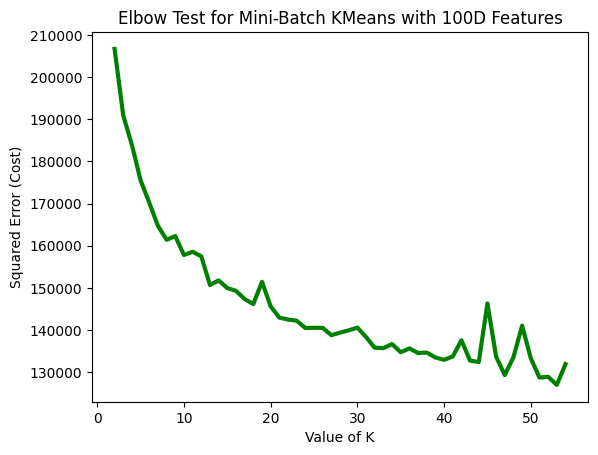

In [ ]:
cost = []
for k in range(2,55):
  _,_,inertia = mbkmeans_clusters(X=feat,k=k,mb=50,print_sil_values=False)
  cost.append(inertia)
plt.plot(range(2, 55), cost, color ='g', linewidth ='3')
plt.title("Elbow Test for Mini-Batch KMeans with 100D Features")
plt.xlabel("Value of K")
plt.ylabel("Squared Error (Cost)")
plt.show()

In [ ]:
clustering, cluster_labels,inertia = mbkmeans_clusters(X=feat,k=10,mb=50,print_sil_values=True)

For n_clusters = 10
Silhouette coefficient: 0.09
Inertia:157800.9424931616
Silhouette values:
    Cluster 6: Size:166 | Avg:0.32 | Min:0.04 | Max: 0.47
    Cluster 3: Size:1253 | Avg:0.15 | Min:-0.03 | Max: 0.33
    Cluster 1: Size:1387 | Avg:0.15 | Min:-0.06 | Max: 0.28
    Cluster 5: Size:517 | Avg:0.14 | Min:0.00 | Max: 0.28
    Cluster 4: Size:1809 | Avg:0.13 | Min:-0.03 | Max: 0.28
    Cluster 2: Size:306 | Avg:0.07 | Min:-0.05 | Max: 0.23
    Cluster 0: Size:1705 | Avg:0.06 | Min:-0.08 | Max: 0.21
    Cluster 7: Size:1695 | Avg:0.03 | Min:-0.14 | Max: 0.17
    Cluster 9: Size:1268 | Avg:-0.00 | Min:-0.15 | Max: 0.11
    Cluster 8: Size:615 | Avg:-0.03 | Min:-0.17 | Max: 0.14


### Clustering of t-SNE features using Various Algorithms

In [ ]:
from hdbscan import HDBSCAN
nclus = 10
algos = [KMeans(n_clusters=nclus, random_state=42,n_init='auto'),
          AgglomerativeClustering(n_clusters=nclus),
          Birch(n_clusters=nclus,branching_factor=20),
          HDBSCAN(),
        ]
algnms = ["KMeans", "Agglomerative","Birch","HDBSCAN"]
for a,nm in zip(algos,algnms):
  a.fit(Xtsne)
  labs = a.labels_
  sil, db, ch = compute_scores(Xtsne, labs)
  fig = px.scatter(x=Xtsne[:,0],y=Xtsne[:,1],color=labs,title=f"{nm} Clusters - Silhoutte Score = {sil:.2f}, DB Score = {db:.2f}, CH Score = {ch:.2f}")
  fig.show()

In [ ]:
from hdbscan import HDBSCAN
hdbmodel = HDBSCAN(min_samples=20,cluster_selection_epsilon=0.1,min_cluster_size=30)
hdbmodel.fit(Xtsne)
labs = hdbmodel.labels_
idx = np.where(labs != -1)
labs2 = labs[idx]
Xtsne2 = Xtsne[idx]
sil, db, ch = compute_scores(Xtsne2, labs2)
centroids = [hdbmodel.weighted_cluster_centroid(c) for c in np.unique(labs) if c != -1]
centroids = np.array(centroids).reshape(-1, 2)
fig = px.scatter(x=Xtsne[:,0],y=Xtsne[:,1],color=labs,
                 title=f"HDBSCAN Clusters - Silhoutte Score = {sil:.2f}, DB Score = {db:.2f}, CH Score = {ch:.2f}")
fig.add_trace(go.Scatter(x=centroids[:, 0], y=centroids[:, 1], mode='markers', marker=dict(symbol='star', size=8), showlegend=False))
fig.show()

### Best Clustering Done by HDBSCAN Algorithm into 15 Clusters, Hence files saved

In [ ]:
res = [hdbmodel,Xtsne,labs,centroids]
with open("ClusteringModelFiles.pickle","wb") as f:
  pickle.dump(res, f)

In [ ]:
!pip install hdbscan

In [ ]:
with open("/content/drive/MyDrive/PBL_M.Tech/ClusteringModelFiles.pickle","rb") as f:
  hdbmodel,Xtsne,labs,centroids = tuple(pickle.load(f))

In [ ]:
distances = cdist(centroids, Xtsne)
closest_indices = np.argmin(distances, axis=1)
for i, index in enumerate(closest_indices):
    print(f"Centroid {i}: Closest data point index = {index}")

Centroid 0: Closest data point index = 847
Centroid 1: Closest data point index = 331
Centroid 2: Closest data point index = 3090
Centroid 3: Closest data point index = 7320
Centroid 4: Closest data point index = 5734
Centroid 5: Closest data point index = 3465
Centroid 6: Closest data point index = 4457
Centroid 7: Closest data point index = 4969
Centroid 8: Closest data point index = 4326
Centroid 9: Closest data point index = 4227
Centroid 10: Closest data point index = 8234
Centroid 11: Closest data point index = 1283
Centroid 12: Closest data point index = 4003
Centroid 13: Closest data point index = 7231
Centroid 14: Closest data point index = 4552


In [ ]:
df1.iloc[847]

reviewText          This was the first Nancy Drew game I had ever ...
summary                                                         Keen!
ReviewsTokens       [[first, nancy, draw, game, ever, play], [alth...
ReviewsTokens2      first nancy draw game ever play although favor...
No. of Sentences                                                   41
No. of Tokens                                                     316
Keywords            [(favorite would jane one interesting, -2.7614...
k1                                favorite would jane one interesting
k2                                               plot that think good
k3                                         mabye even you really good
k4                                             puzzle like I say good
k5                                        plot be complicate nd title
Name: 847, dtype: object

In [ ]:
print("No. of Reviews in each cluster:\n",pd.Series(hdbmodel.labels_).value_counts())

No. of Reviews in each cluster:
  12    2208
-1     1947
 7     1820
 4     1005
 11     769
 10     761
 14     669
 1      433
 2      220
 5      156
 6      156
 0      151
 3      122
 13     117
 9      115
 8       72
Name: count, dtype: int64


#### Most Representative Review of a Test Cluster

In [ ]:
test_cluster = 12
most_rep_docs = np.argsort(np.linalg.norm(Xtsne - centroids[test_cluster], axis=1))
for d in most_rep_docs[:3]:
    print(d)
    print(df1['reviewText'][d])
    print("-------------")

4003
This is the worst antivirus program I've ever tried to install in my computer. First of all it wanted to be the only antivirus program and it removed my AVG, McAfee, and a couple of adware programs that I had. Then it would get part way through the install and lock up. I never did get it to finish the installation. The last time that I tried to install it, it said that it had already been installed on 3 PCs and couldn't be installed in another one. I never got it to install in one computer muchless 3 of them like it was supposed to!
All it did was cause me a lot of frustration, strip all the protection that I did have out of my laptop and leave me with nothing for virus protection.
-------------
3051
I'm running Windows XP SP2 on my computer.  I also had the McAfee Virus Scan Plus installed.  Upon uninstalling MVSP, the Kaspersky AV software doesn't install.  You'll be able to unpack it, and it will run start-up scripts.  However, it will find that you still have McAfee products o

In [ ]:
cc100d = feat[closest_indices]
cc100d.shape

(15, 100)

In [ ]:
print("Most representative terms per cluster (based on centroids):")
for i in range(15):
    tokens_per_cluster = ""
    most_representative = model.wv.most_similar(positive=[cc100d[i]], topn=10)
    for t in most_representative:
        tokens_per_cluster += f"{t[0]} "
    print(f"Cluster {i}: {tokens_per_cluster}")

Most representative terms per cluster (based on centroids):
Cluster 0: puzzle game nancy creepy spooky storyline twist plot she laugh 
Cluster 1: wifi ethernet lan ghz 80211a 80211b wireless device ethernettowifi network 
Cluster 2: teach language german learn spanish lesson english chinese japanese class 
Cluster 3: ancestrycom family ancestry online genealogy research tree gather cloud software 
Cluster 4: turbotax taxis year return tt tax accountant form turbo peachtree 
Cluster 5: gps route reroute trip street st map recognition delorme mappoint 
Cluster 6: dragon msre dictate command spell sentence word dictation punctuation macspeech 
Cluster 7: edit fun novice lot amateur video newbie x3 beginner look 
Cluster 8: unzip zip zipping winzip file selfextracte decompress 7zip archive compression 
Cluster 9: backup restore reinstall reboot disk acroni boot install restart ati 
Cluster 10: office doc wp word ms xlsx document docx open wordperfect 
Cluster 11: window xp vista desktop 64

In [ ]:
df_clusters = pd.DataFrame({
    "text": df1['reviewText'],
    "tokens": df1['ReviewsTokens2'],
    "clustermbk": cluster_labels,
    "clusterkm2d": lablist[0],
    "clusterkmtsne": lablist[1],
    "clusterhdbscantsne": labs
})
df_clusters.head()

,text,tokens,clustermbk,clusterkm2d,clusterkmtsne,clusterhdbscantsne
0,I've been using Dreamweaver (and it's predeces...,I use dreamweaver predecessor macromedia ultra...,7,0,0,7
1,"The demo is done with the PC version, with ref...",demo do pc version reference mac version need ...,2,0,0,7
2,If you've been wanting to learn how to create ...,you want learn create website either lack conf...,2,0,0,-1
3,I've been creating websites with Dreamweaver f...,I create website dreamweaver year experience t...,7,0,0,7
4,I decided (after trying a number of other prod...,decide try number product switch gold standard...,7,0,0,7


In [ ]:
from plotly.subplots import make_subplots
dims = [i for i in range(2,20)] + [i for i in range(20,99,5)]
nclus = 10
algos = [KMeans(n_clusters=nclus, random_state=42, n_init='auto'),
         AgglomerativeClustering(n_clusters=nclus),
         Birch(n_clusters=nclus, branching_factor=20),
         HDBSCAN(min_samples=20, cluster_selection_epsilon=0.1, min_cluster_size=30)]
fig = make_subplots(rows=1, cols=3, subplot_titles=("Silhouette Score", "DB Score", "CH Score"),horizontal_spacing = 0.04,x_title='Dimensions')
for a, nm,c in zip(algos, ["KMeans", "Agglomerative", "Birch", "HDBSCAN"],['blue','orange','green','red']):
    print(nm)
    sils, dbs, chs = [], [], []
    for d in tqdm.tqdm(dims):
        X = PCA(d, random_state=42).fit_transform(feat)
        a.fit(X)
        labs = a.labels_
        if nm == 'HDBSCAN':
            idx = np.where(labs != -1)
            labs = labs[idx]
            X = X[idx]
        sil, db, ch = compute_scores(X, labs)
        sils.append(sil)
        dbs.append(db)
        chs.append(ch)
    fig.add_trace(go.Scatter(x=dims, y=sils, mode='lines',name=nm,line_color=c,legendgroup='1'),row=1,col=1)
    fig.add_trace(go.Scatter(x=dims, y=dbs, mode='lines',name=nm,line_color=c,legendgroup='2'),row=1,col=2)
    fig.add_trace(go.Scatter(x=dims, y=chs, mode='lines',name=nm,line_color=c,legendgroup='3'),row=1,col=3)
fig.update_layout(title={'text':"Clustering Scores vs Dimensions",'y': 0.95,'x': 0.5},yaxis=dict(title="Score"),margin=dict(l=40, r=80, t=70, b=60))
fig.update_yaxes(type="log", row=1, col=3)
fig.show()

KMeans


100%|██████████| 34/34 [02:18<00:00,  4.07s/it]


Agglomerative


100%|██████████| 34/34 [07:57<00:00, 14.05s/it]


Birch


100%|██████████| 34/34 [06:13<00:00, 11.00s/it]


HDBSCAN


100%|██████████| 34/34 [04:50<00:00,  8.53s/it]


In [ ]:
import plotly.graph_objects as go
dims = [i for i in range(2,20)] + [i for i in range(20,101,5)] + [2,3]
dra = [PCA(d,random_state=42) for d in dims[:-2]] + [TSNE(d,random_state=42) for d in [2,3]]
outliers,n_clusters,hover_text,sils = [],[],[],[]
for d,dr in tqdm.tqdm(zip(dims,dra)):
    X = dr.fit_transform(feat)
    a.fit(X)
    labs = a.labels_
    idx = np.where(labs != -1)
    out = (len(X) - len(idx[0]))/len(X) * 100
    nc = len(np.unique(labs)) - 1
    labs = labs[idx]
    X = X[idx]
    sil = silhouette_score(X, labs)
    drt = 'PCA' if isinstance(dr,PCA) else 't-SNE'
    hover_text.append(f'Dimensions: {d}<br>% Outliers: {out:.2f}%<br>Clusters: {nc}<br>Sil. Score: {sil:.2f}<br>DR Technique: {drt}')
    sils.append(sil)
    outliers.append(out)
    n_clusters.append(nc)

fig = go.Figure(data=go.Scatter(x=outliers,y=n_clusters,mode='markers',marker=dict(color=dims, colorscale='rainbow',
                                size=[10]*(len(dims)-2) + [18]*2,colorbar=dict(title='Dimensions')),text=hover_text,hoverinfo='text'))
fig.update_layout(title='No. of Clusters vs. Percentage of Outliers while varying Dimensions in HDBSCAN Clustering',xaxis=dict(title='% Outliers'),
                  yaxis=dict(title='No. of Clusters',tickvals=list(range(max(n_clusters)+1))),width=850,height=600,margin=dict(l=55, r=60, t=70, b=60))
fig.show()

37it [14:36, 23.70s/it] 


### **WordCloud Plots of Review Clusters in Different Scenarios**

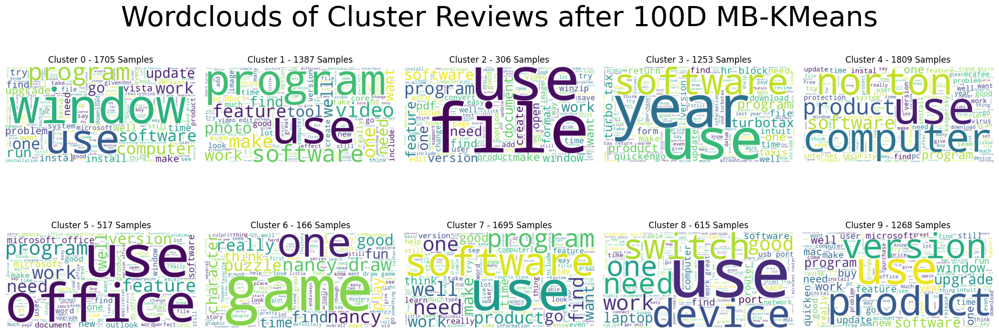

In [ ]:
fig, axs = plt.subplots(2,5, figsize=(20, 8))
for c, ax in enumerate(axs.flatten()):
    toks = df_clusters[df_clusters['clustermbk'] == c]['tokens']
    tokens = ' '.join(toks)
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(tokens)
    ax.imshow(wordcloud, interpolation='bilinear')
    ax.set_title(f'Cluster {c} - {len(toks)} Samples')
    ax.axis('off')
plt.tight_layout()
fig.suptitle('Wordclouds of Cluster Reviews after 100D MB-KMeans', fontsize=40)
plt.show()

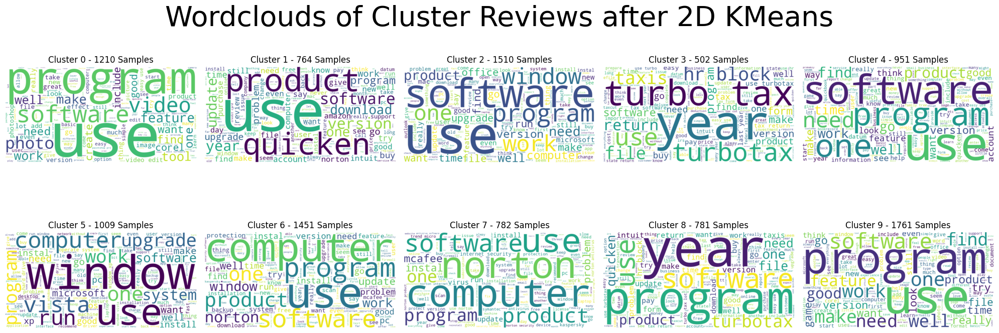

In [ ]:
fig, axs = plt.subplots(2,5, figsize=(20, 8))
for c, ax in enumerate(axs.flatten()):
    toks = df_clusters[df_clusters['clusterkm2d'] == c]['tokens']
    tokens = ' '.join(toks)
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(tokens)
    ax.imshow(wordcloud, interpolation='bilinear')
    ax.set_title(f'Cluster {c} - {len(toks)} Samples')
    ax.axis('off')
plt.tight_layout()
fig.suptitle('Wordclouds of Cluster Reviews after 2D KMeans', fontsize=40)
plt.show()

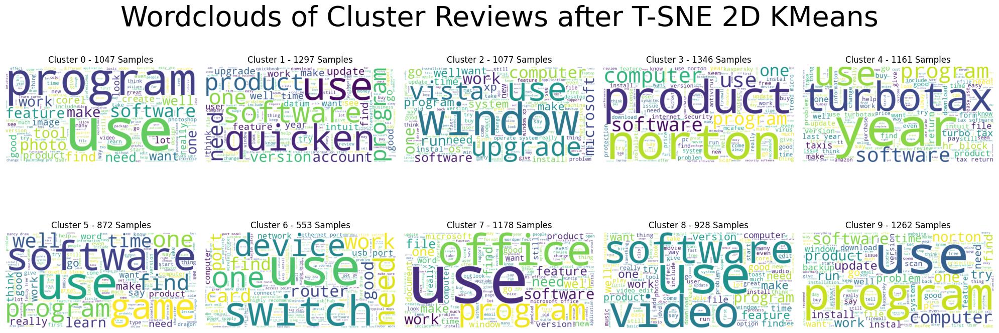

In [ ]:
fig, axs = plt.subplots(2,5, figsize=(20, 8))
for c, ax in enumerate(axs.flatten()):
    toks = df_clusters[df_clusters['clusterkmtsne'] == c]['tokens']
    tokens = ' '.join(toks)
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(tokens)
    ax.imshow(wordcloud, interpolation='bilinear')
    ax.set_title(f'Cluster {c} - {len(toks)} Samples')
    ax.axis('off')
plt.tight_layout()
fig.suptitle('Wordclouds of Cluster Reviews after T-SNE 2D KMeans', fontsize=40)
plt.show()

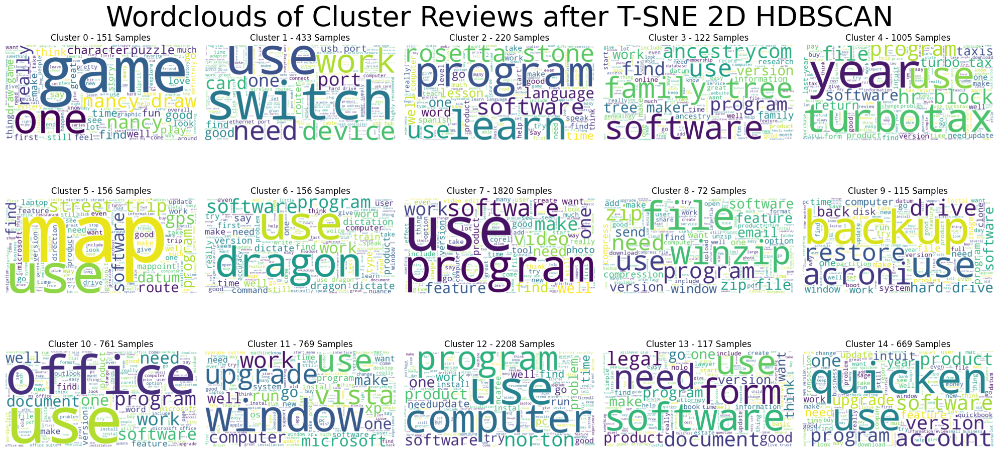

In [ ]:
fig, axs = plt.subplots(3,5, figsize=(20, 10))
for c, ax in enumerate(axs.flatten()):
    toks = df_clusters[df_clusters['clusterhdbscantsne'] == c]['tokens']
    tokens = ' '.join(toks)
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(tokens)
    ax.imshow(wordcloud, interpolation='bilinear')
    ax.set_title(f'Cluster {c} - {len(toks)} Samples')
    ax.axis('off')
plt.tight_layout()
fig.suptitle('Wordclouds of Cluster Reviews after T-SNE 2D HDBSCAN', fontsize=40)
plt.show()

### **Building Deep ANN Classification Model**

In [ ]:
path = "/content/drive/MyDrive/PBL_M.Tech/AmazonReviewsKeywordsExtracted.csv"
df1 = pd.read_csv(path,index_col=0,converters={'ReviewsTokens': ast.literal_eval,'Keywords':ast.literal_eval})
df1.head()

,reviewText,summary,ReviewsTokens,ReviewsTokens2,No. of Sentences,No. of Tokens,Keywords,k1,k2,k3,k4,k5
0,I've been using Dreamweaver (and it's predeces...,A solid overview of Dreamweaver CS5,"[[I, use, dreamweaver, predecessor, macromedia...",I use dreamweaver predecessor macromedia ultra...,11,109,"[(dreamweaver do go great, -0.6479343576543865...",dreamweaver do go great,site someone go course exit,version dreamweaver do go great,start basic overview html continue,build entire ecommerce system class
1,"The demo is done with the PC version, with ref...",A good value,"[[demo, do, pc, version, reference, mac, versi...",demo do pc version reference mac version need ...,25,224,"[(read take test instead put, -0.0439401916117...",read take test instead put,site dw create new web,player screen standard mode resize,checklist project management site development,closedcaptione set bookmark selftest chapter
2,If you've been wanting to learn how to create ...,This is excellent software for those who want ...,"[[you, want, learn, create, website, either, l...",you want learn create website either lack conf...,39,811,"[(review hopefully anyone look core, -11.39254...",review hopefully anyone look core,feature you also treat,offer several new advantagesfeature,html could use refresher,lot course quite affordable
3,I've been creating websites with Dreamweaver f...,A Fantastic Overview of Dream Weaver and Web D...,"[[I, create, website, dreamweaver, year, exper...",I create website dreamweaver year experience t...,19,222,"[(version use get chance, -0.8577341102503274)...",version use get chance,teach one thing I hack,upgrade alone value train,learn dw even web,overview use dw be substitute
4,I decided (after trying a number of other prod...,Excellent Tutorials!,"[[decide, try, number, product, switch, gold, ...",decide try number product switch gold standard...,15,103,"[(dreamweaver come clearly take learn, -1.0241...",dreamweaver come clearly take learn,good way go you learn,dreamweaver go help product,learn dw get design,dreamweaver go help product review


In [ ]:
mpath = "/content/drive/MyDrive/PBL_M.Tech/Word2VecModel"
model = Word2Vec.load(mpath)

In [ ]:
!pip install hdbscan

In [ ]:
with open("/content/drive/MyDrive/PBL_M.Tech/ClusteringModelFiles.pickle","rb") as f:
  hdbmodel,Xtsne,labs,centroids = tuple(pickle.load(f))

In [ ]:
pd.Series(labs).value_counts()

 12    2208
-1     1947
 7     1820
 4     1005
 11     769
 10     761
 14     669
 1      433
 2      220
 5      156
 6      156
 0      151
 3      122
 13     117
 9      115
 8       72
Name: count, dtype: int64

In [ ]:
df1['Class'] = labs
df1 = df1[df1['Class'] != -1]
df1.head()

,reviewText,summary,ReviewsTokens,ReviewsTokens2,No. of Sentences,No. of Tokens,Keywords,k1,k2,k3,k4,k5,Class
0,I've been using Dreamweaver (and it's predeces...,A solid overview of Dreamweaver CS5,"[[I, use, dreamweaver, predecessor, macromedia...",I use dreamweaver predecessor macromedia ultra...,11,109,"[(dreamweaver do go great, -0.6479343576543865...",dreamweaver do go great,site someone go course exit,version dreamweaver do go great,start basic overview html continue,build entire ecommerce system class,7
1,"The demo is done with the PC version, with ref...",A good value,"[[demo, do, pc, version, reference, mac, versi...",demo do pc version reference mac version need ...,25,224,"[(read take test instead put, -0.0439401916117...",read take test instead put,site dw create new web,player screen standard mode resize,checklist project management site development,closedcaptione set bookmark selftest chapter,7
3,I've been creating websites with Dreamweaver f...,A Fantastic Overview of Dream Weaver and Web D...,"[[I, create, website, dreamweaver, year, exper...",I create website dreamweaver year experience t...,19,222,"[(version use get chance, -0.8577341102503274)...",version use get chance,teach one thing I hack,upgrade alone value train,learn dw even web,overview use dw be substitute,7
4,I decided (after trying a number of other prod...,Excellent Tutorials!,"[[decide, try, number, product, switch, gold, ...",decide try number product switch gold standard...,15,103,"[(dreamweaver come clearly take learn, -1.0241...",dreamweaver come clearly take learn,good way go you learn,dreamweaver go help product,learn dw get design,dreamweaver go help product review,7
6,I spent several hours on the lesson and I love...,excellent video training material,"[[spend, several, hour, lesson, love], [detail...",spend several hour lesson love detail clear in...,10,61,"[(support highly recommend teach series, 1.815...",support highly recommend teach series,love detail clear instruction graph,graph audio video playback nice,tool maneuver dreamweaver app excellent,maneuver dreamweaver app excellent tool,7


In [ ]:
df1.shape

(8774, 13)

In [ ]:
nidx = np.array(df1[df1[['k1', 'k2', 'k3', 'k4', 'k5']].isna().any(axis=1)].index)

In [ ]:
df2 = df1[~df1.index.isin(nidx)].copy()
df2.head(6)

,reviewText,summary,ReviewsTokens,ReviewsTokens2,No. of Sentences,No. of Tokens,Keywords,k1,k2,k3,k4,k5,Class
0,I've been using Dreamweaver (and it's predeces...,A solid overview of Dreamweaver CS5,"[[I, use, dreamweaver, predecessor, macromedia...",I use dreamweaver predecessor macromedia ultra...,11,109,"[(dreamweaver do go great, -0.6479343576543865...",dreamweaver do go great,site someone go course exit,version dreamweaver do go great,start basic overview html continue,build entire ecommerce system class,7
1,"The demo is done with the PC version, with ref...",A good value,"[[demo, do, pc, version, reference, mac, versi...",demo do pc version reference mac version need ...,25,224,"[(read take test instead put, -0.0439401916117...",read take test instead put,site dw create new web,player screen standard mode resize,checklist project management site development,closedcaptione set bookmark selftest chapter,7
3,I've been creating websites with Dreamweaver f...,A Fantastic Overview of Dream Weaver and Web D...,"[[I, create, website, dreamweaver, year, exper...",I create website dreamweaver year experience t...,19,222,"[(version use get chance, -0.8577341102503274)...",version use get chance,teach one thing I hack,upgrade alone value train,learn dw even web,overview use dw be substitute,7
4,I decided (after trying a number of other prod...,Excellent Tutorials!,"[[decide, try, number, product, switch, gold, ...",decide try number product switch gold standard...,15,103,"[(dreamweaver come clearly take learn, -1.0241...",dreamweaver come clearly take learn,good way go you learn,dreamweaver go help product,learn dw get design,dreamweaver go help product review,7
6,I spent several hours on the lesson and I love...,excellent video training material,"[[spend, several, hour, lesson, love], [detail...",spend several hour lesson love detail clear in...,10,61,"[(support highly recommend teach series, 1.815...",support highly recommend teach series,love detail clear instruction graph,graph audio video playback nice,tool maneuver dreamweaver app excellent,maneuver dreamweaver app excellent tool,7
7,I have had Dreamweaver MX2004 since it came ou...,Great Video for a Difficult at Times Program,"[[dreamweaver, mx2004, since, come, back], [sp...",dreamweaver mx2004 since come back spend year ...,16,181,"[(point get new version, -0.13814674232322277)...",point get new version,understand get one appreciate fact,work way understand know work,guide point get new version,demandanbspwhich make good reference guide,7


In [ ]:
df2.shape[0]

8434

In [ ]:
df2.iloc[6757]

reviewText          I had always waited til fir R3 or so. This tim...
summary                        All these years I saw others problems!
ReviewsTokens       [[always, wait, til, fir, r3], [time, get, man...
ReviewsTokens2      always wait til fir r3 time get many other get...
No. of Sentences                                                    3
No. of Tokens                                                      16
Keywords            [(fargo one find solution dissappointe, 0.0004...
k1                               fargo one find solution dissappointe
k2                                                       wait til fir
k3                                            fargo one find solution
k4                                                            til fir
k5                                                           wait til
Name: 7067, dtype: object

In [ ]:
!pip install yake

In [ ]:
tsne = TSNE(2,random_state=42)
X = pd.DataFrame(columns=[f'kwfeat{k}' for k in range(10)])
cols = ['k1','k2','k3','k4','k5']
columns=list(df2.columns[7:12])
j = 0
for col in tqdm.tqdm(cols):
  feat = np.zeros((df2.shape[0],100))
  for i,rev in enumerate(df2[col]):
    ft = []
    for w in rev.split():
      try:
        ft.append(list(model.wv[w]))
      except KeyError:
        continue
    ft = np.array(ft)
    if len(ft)==0:
      feat[i] = np.zeros(100)
    else:
      feat[i] = ft.mean(axis=0)
  #print(np.isnan(feat[np.where(np.isnan(feat).any())[0]]).any())
  #for n in range(df2.shape[0]):
  #  if np.isnan(feat[n]).sum() != 0:
  #    print("FOUND at",n,np.isnan(feat[n]).sum())
  #print(np.isnan(feat[0]).any())
  Xtsne = tsne.fit_transform(feat)
  X[f"kwfeat{j}"] = Xtsne[:,0]
  X[f"kwfeat{j+1}"] = Xtsne[:,1]
  j+=2
X.head()

100%|██████████| 5/5 [09:51<00:00, 118.34s/it]


,kwfeat0,kwfeat1,kwfeat2,kwfeat3,kwfeat4,kwfeat5,kwfeat6,kwfeat7,kwfeat8,kwfeat9
0,23.679659,1.383886,-16.274796,2.825323,26.097109,28.964144,-20.773966,32.501961,19.793850,19.846485
1,-43.008739,-12.375896,-56.336235,5.718520,28.520939,-25.739101,-34.421761,9.567602,2.507813,-40.568420
2,9.299006,33.502705,-1.841439,-2.396029,-31.492722,0.973617,-46.967842,34.045166,-4.797048,-17.403440
3,75.543251,13.557011,50.694317,37.543346,26.085062,29.018904,-47.205299,34.200863,-30.464594,-33.500610
4,62.270893,32.593311,2.358373,35.941719,54.847530,-28.198999,-38.668774,7.463848,31.993242,-28.431814


In [ ]:
X['No. of Sentences'] = df2['No. of Sentences'].values
X['No. of Tokens'] = df2['No. of Tokens'].values
X.head()

,kwfeat0,kwfeat1,kwfeat2,kwfeat3,kwfeat4,kwfeat5,kwfeat6,kwfeat7,kwfeat8,kwfeat9,No. of Sentences,No. of Tokens
0,23.679659,1.383886,-16.274796,2.825323,26.097109,28.964144,-20.773966,32.501960,19.793850,19.846485,11,109
1,-43.008740,-12.375896,-56.336235,5.718520,28.520939,-25.739101,-34.421760,9.567602,2.507813,-40.568420,25,224
2,9.299005,33.502705,-1.841439,-2.396029,-31.492722,0.973617,-46.967842,34.045166,-4.797048,-17.403440,19,222
3,75.543250,13.557011,50.694317,37.543346,26.085062,29.018904,-47.205300,34.200863,-30.464594,-33.500610,15,103
4,62.270893,32.593310,2.358373,35.941720,54.847530,-28.199000,-38.668774,7.463848,31.993242,-28.431814,10,61


In [ ]:
X.describe()

,kwfeat0,kwfeat1,kwfeat2,kwfeat3,kwfeat4,kwfeat5,kwfeat6,kwfeat7,kwfeat8,kwfeat9,No. of Sentences,No. of Tokens
count,8434.000000,8434.000000,8434.000000,8434.000000,8434.000000,8434.000000,8434.000000,8434.000000,8434.000000,8434.000000,8434.000000,8434.000000
mean,0.185461,-0.044724,0.181059,0.117762,0.658632,-0.486817,-0.454362,-0.124399,-0.514051,0.189729,12.977946,119.682476
std,34.151261,38.859441,33.590248,38.222064,33.966204,35.079277,32.891456,38.368980,35.501599,33.282926,14.715814,153.015943
min,-80.763535,-92.268750,-82.691060,-85.967740,-83.078650,-85.672310,-78.070190,-82.944664,-83.294716,-83.740450,1.000000,10.000000
25%,-25.669422,-27.763642,-24.691778,-28.935987,-25.020248,-24.568265,-25.520968,-28.948029,-25.796570,-23.971341,5.000000,37.000000
50%,-1.358656,0.193629,-3.023497,0.918318,-1.406340,0.067323,2.518080,1.822461,1.375329,0.597491,9.000000,77.000000
75%,24.161017,27.938849,25.249836,26.730750,25.663327,24.560342,23.975905,27.153182,24.686230,25.709333,16.000000,144.000000
max,80.421745,85.634420,76.053670,85.179370,76.623764,77.096560,79.996796,81.488335,83.298600,77.056984,308.000000,3045.000000


In [ ]:
X.to_csv('FeaturesForANN.csv')

In [ ]:
path = "/content/drive/MyDrive/PBL_M.Tech/FeaturesForANN.csv"
X = pd.read_csv(path,index_col=0)
X.head()

,kwfeat0,kwfeat1,kwfeat2,kwfeat3,kwfeat4,kwfeat5,kwfeat6,kwfeat7,kwfeat8,kwfeat9,No. of Sentences,No. of Tokens
0,23.679659,1.383886,-16.274796,2.825323,26.097109,28.964144,-20.773966,32.501960,19.793850,19.846485,11,109
1,-43.008740,-12.375896,-56.336235,5.718520,28.520939,-25.739101,-34.421760,9.567602,2.507813,-40.568420,25,224
2,9.299005,33.502705,-1.841439,-2.396029,-31.492722,0.973617,-46.967842,34.045166,-4.797048,-17.403440,19,222
3,75.543250,13.557011,50.694317,37.543346,26.085062,29.018904,-47.205300,34.200863,-30.464594,-33.500610,15,103
4,62.270893,32.593310,2.358373,35.941720,54.847530,-28.199000,-38.668774,7.463848,31.993242,-28.431814,10,61


In [ ]:
df2['Class'].value_counts()

Class
12    2107
7     1758
4      970
11     742
10     736
14     641
1      418
2      211
6      148
5      147
0      145
3      119
9      113
13     108
8       71
Name: count, dtype: int64

In [ ]:
Y = df2['Class'].values

In [ ]:
data = (X,Y)
with open("DataForANN.pickle","wb") as f:
  pickle.dump(data, f)

In [ ]:
#path = "/content/drive/MyDrive/PBL_M.tech/DataForANN.pickle"
path = "/content/DataForANN.pickle"
with open(path,"rb") as f:
  X,Y = tuple(pickle.load(f))

In [ ]:
X.shape

(8434, 12)

In [ ]:
y= np.zeros((Y.size,Y.max()+1))
y[np.arange(Y.size),Y]=1

<Axes: >

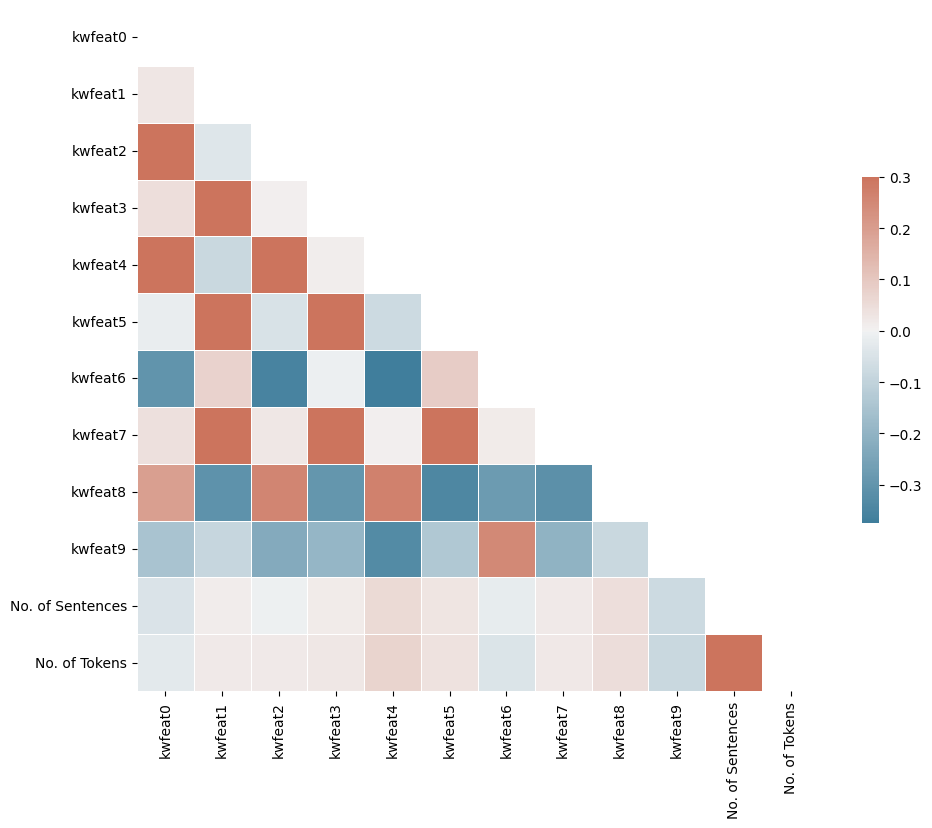

In [ ]:
import seaborn as sns
corr=X.corr()

mask = np.triu(np.ones_like(corr, dtype=bool))
f, ax = plt.subplots(figsize=(11, 9))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [ ]:
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
trainX, testX, trainY, testY = train_test_split(X, y, test_size=0.35, random_state=42,stratify=y)

In [ ]:
trainX.shape

(5482, 12)

In [ ]:
print(trainX.shape)
print(testX.shape)
print(trainY.shape)
print(testY.shape)

(5482, 12)
(2952, 12)
(5482, 15)
(2952, 15)


In [ ]:
pd.Series(Y).value_counts()

12    2107
7     1758
4      970
11     742
10     736
14     641
1      418
2      211
6      148
5      147
0      145
3      119
9      113
13     108
8       71
Name: count, dtype: int64

In [ ]:
oversample = SMOTE(sampling_strategy='auto', random_state=42,k_neighbors=5)
trainX, trainY = oversample.fit_resample(trainX, trainY)

In [ ]:
print(trainX.shape)
print(testX.shape)
print(trainY.shape)
print(testY.shape)

(20550, 12)
(2952, 12)
(20550, 15)
(2952, 15)


In [ ]:
import keras
from keras.models import Model
from keras.layers import Dense, Dropout, Flatten
from keras import utils
import numpy as np
import pandas as pd
from keras.callbacks import EarlyStopping
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten,Input
from keras.optimizers import Adam
from keras.utils import to_categorical
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score,precision_score,recall_score,f1_score

In [ ]:
scaler = StandardScaler()
trainX = scaler.fit_transform(trainX)
testX = scaler.transform(testX)

In [ ]:
batchsize = 32

deep = Sequential(name="Deep_Classifier")
inputs = keras.Input(shape=(X.shape[0], X.shape[1]))

deep.add(Dense(12, input_shape = (X.shape[1],),kernel_initializer='uniform',activation='relu'))

deep.add(Dense(240, kernel_initializer='uniform',activation='relu'))
deep.add(Dense(240, kernel_initializer='uniform',activation='relu'))

deep.add(Dense(480, kernel_initializer='uniform',activation='relu'))
deep.add(Dense(480, kernel_initializer='uniform',activation='relu'))

deep.add(Dense(480, kernel_initializer='uniform',activation='relu'))
deep.add(Dense(480, kernel_initializer='uniform',activation='relu'))

deep.add(Dropout(rate=0.5,seed=9))
deep.add(Dense(15,activation='softmax'))
deep.compile(loss = 'categorical_crossentropy', optimizer='adam',metrics = ['accuracy'])
print(deep.summary())


Model: "Deep_Classifier"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 12)                156       
                                                                 
 dense_1 (Dense)             (None, 240)               3120      
                                                                 
 dense_2 (Dense)             (None, 240)               57840     
                                                                 
 dense_3 (Dense)             (None, 480)               115680    
                                                                 
 dense_4 (Dense)             (None, 480)               230880    
                                                                 
 dense_5 (Dense)             (None, 480)               230880    
                                                                 
 dense_6 (Dense)             (None, 480)           

In [ ]:
history = deep.fit(trainX,trainY, epochs = 30, batch_size = batchsize)

Epoch 1/30
643/643 [==============================] - 12s 16ms/step - loss: 2.0867 - accuracy: 0.2436
Epoch 2/30
643/643 [==============================] - 11s 17ms/step - loss: 1.7017 - accuracy: 0.4105
Epoch 3/30
643/643 [==============================] - 10s 16ms/step - loss: 1.5649 - accuracy: 0.4648
Epoch 4/30
643/643 [==============================] - 11s 17ms/step - loss: 1.4452 - accuracy: 0.5080
Epoch 5/30
643/643 [==============================] - 10s 15ms/step - loss: 1.3331 - accuracy: 0.5517
Epoch 6/30
643/643 [==============================] - 10s 15ms/step - loss: 1.2272 - accuracy: 0.5927
Epoch 7/30
643/643 [==============================] - 10s 15ms/step - loss: 1.1245 - accuracy: 0.6306
Epoch 8/30
643/643 [==============================] - 9s 15ms/step - loss: 1.0289 - accuracy: 0.6597
Epoch 9/30
643/643 [==============================] - 9s 15ms/step - loss: 0.9460 - accuracy: 0.6888
Epoch 10/30
643/643 [==============================] - 10s 16ms/step - loss: 0.8719 

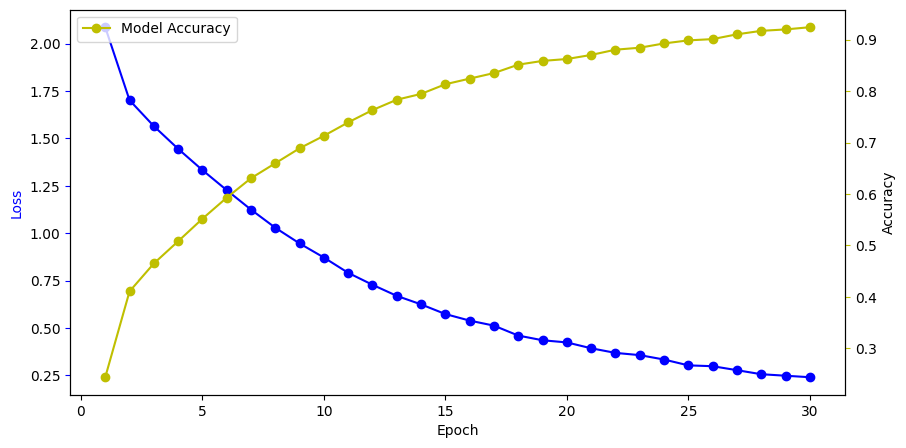

In [ ]:
import matplotlib.pyplot as plt

epochs = range(1, len(history.history['loss']) + 1)
fig, ax1 = plt.subplots(figsize=(10, 5))
ax1.plot(epochs, history.history['loss'], 'bo-', label='Loss')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Loss', color='b')
ax1.tick_params('y', color='b')
ax2 = ax1.twinx()
ax2.plot(epochs, history.history['accuracy'], 'yo-', label='Model Accuracy')
ax2.set_ylabel('Accuracy')
ax2.tick_params('y', color='y')
#plt.title('Epoch wise Loss and Accuracy')
plt.legend(loc='upper left')
plt.show()

In [ ]:
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score,precision_score,recall_score,f1_score
pred = deep.predict(testX)
pred = np.argmax(pred,axis=1)
y_true = np.argmax(testY,axis=1)
print("Accuracy Score:",accuracy_score(y_true, pred))
print("Precision Score:",precision_score(y_true, pred,average='macro'))
print("Recall Score:",recall_score(y_true, pred,average='macro'))
print("F1 Score:",f1_score(y_true, pred,average='macro'))
print(classification_report(y_true, pred))

643/643 [==============================] - 8s 11ms/step
Accuracy Score: 0.9307542579075426
Precision Score: 0.9304067443761453
Recall Score: 0.9307542579075425
F1 Score: 0.9301255304508372
              precision    recall  f1-score   support

           0       0.97      1.00      0.98      1370
           1       0.99      0.98      0.98      1370
           2       0.94      0.98      0.96      1370
           3       0.98      0.96      0.97      1370
           4       0.92      0.95      0.94      1370
           5       0.97      0.97      0.97      1370
           6       0.98      0.98      0.98      1370
           7       0.85      0.84      0.85      1370
           8       0.99      0.98      0.98      1370
           9       0.95      0.97      0.96      1370
          10       0.84      0.93      0.88      1370
          11       0.90      0.82      0.86      1370
          12       0.82      0.74      0.78      1370
          13       0.97      0.99      0.98      1370
